In [189]:

import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import torch
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, datasets, transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
     

In [167]:
import torch

if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"
else:
    device = "cpu"

print("Using:", device)

Using: mps


In [168]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Bild-Transformationen (Resize, Tensor)
transform = transforms.Compose([
    transforms.Resize((180, 180)),
    transforms.ToTensor(),
])

# Dataset laden
train_dataset = datasets.ImageFolder(
    root="tf_flowers_images",
    transform=transform
)

# DataLoader erstellen
train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=True
)


In [169]:
classes = train_dataset.classes
print("Anzahl Bilder:", len(train_dataset))
print("Klassennamen:", classes)
print("Mapping Klassen → Label:", train_dataset.class_to_idx)


Anzahl Bilder: 3670
Klassennamen: ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']
Mapping Klassen → Label: {'daisy': 0, 'dandelion': 1, 'roses': 2, 'sunflowers': 3, 'tulips': 4}


In [170]:
images, labels = next(iter(train_loader))
print(images.shape)   # (batch_size, 3, 180, 180)
print(labels.shape)   # (batch_size,)


torch.Size([32, 3, 180, 180])
torch.Size([32])


In [171]:
from torch.utils.data import random_split

train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size

train_ds, val_ds = random_split(train_dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32)

In [172]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SimpleNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(3*180*180, 128)
        self.fc2 = nn.Linear(128, 5)    # 5 flower classes

    def forward(self, x):
        x = x.view(x.size(0), -1)   # flatten
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

model = SimpleNet()

In [173]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
for epoch in range(50):  # number of epochs
    running_loss = 0.0
    
    for images, labels in train_loader:
        # 1. Zero gradients
        optimizer.zero_grad()
        
        # 2. Forward pass
        outputs = model(images)
        
        # 3. Compute loss
        loss = criterion(outputs, labels)
        
        # 4. Backward pass
        loss.backward()
        
        # 5. Update weights
        optimizer.step()
        
        running_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {running_loss/len(train_loader):.4f}")


Epoch 1, Loss: 5.3421
Epoch 2, Loss: 1.4252
Epoch 3, Loss: 1.2971
Epoch 4, Loss: 1.1914
Epoch 5, Loss: 1.2037
Epoch 6, Loss: 1.2116
Epoch 7, Loss: 1.1908
Epoch 8, Loss: 1.1866
Epoch 9, Loss: 1.1330
Epoch 10, Loss: 1.1582
Epoch 11, Loss: 1.1001
Epoch 12, Loss: 1.0348
Epoch 13, Loss: 1.0606
Epoch 14, Loss: 1.0425
Epoch 15, Loss: 0.9822
Epoch 16, Loss: 1.0134
Epoch 17, Loss: 0.9867
Epoch 18, Loss: 0.9420
Epoch 19, Loss: 0.9101
Epoch 20, Loss: 1.0132
Epoch 21, Loss: 1.0031
Epoch 22, Loss: 0.9355
Epoch 23, Loss: 0.8783
Epoch 24, Loss: 0.8566
Epoch 25, Loss: 0.8602
Epoch 26, Loss: 0.7921
Epoch 27, Loss: 0.7745
Epoch 28, Loss: 0.7909
Epoch 29, Loss: 0.7810
Epoch 30, Loss: 0.7295
Epoch 31, Loss: 0.7722
Epoch 32, Loss: 0.6517
Epoch 33, Loss: 0.7121
Epoch 34, Loss: 0.6594
Epoch 35, Loss: 0.6565
Epoch 36, Loss: 0.6378
Epoch 37, Loss: 0.6730
Epoch 38, Loss: 0.7018
Epoch 39, Loss: 0.7439
Epoch 40, Loss: 0.7218
Epoch 41, Loss: 0.5767
Epoch 42, Loss: 0.6043
Epoch 43, Loss: 0.5257
Epoch 44, Loss: 0.62

In [174]:
correct = 0
total = 0

model.eval()                         # evaluation mode
with torch.no_grad():                # no gradients needed
    for images, labels in train_loader:
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = correct / total
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 71.25%


In [175]:
from sklearn.metrics import (
    roc_curve, auc,
    precision_recall_curve, f1_score
)
# Evaluate the model using PyTorch
model.to(device)
model.eval()

y_true = []
y_pred = []

for images, labels in val_loader:
    images = images.to(device)
    outputs = model(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')

Macro F1 Score: 0.40983782361064913


10 epochs: Macro F1 Score: 0.3965480814869717
50 epochs: Macro F1 Score: 0.40983782361064913

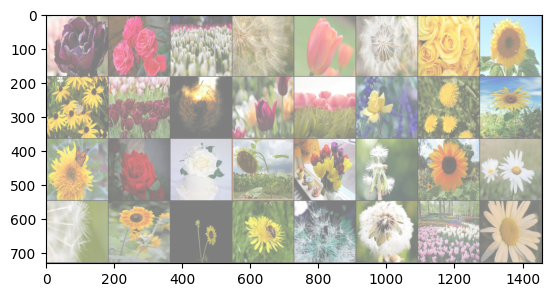

tulips roses tulips dandelion tulips dandelion roses sunflowers sunflowers tulips dandelion tulips tulips roses dandelion sunflowers sunflowers roses roses sunflowers tulips dandelion sunflowers daisy dandelion sunflowers sunflowers dandelion dandelion dandelion tulips daisy


In [111]:
# functions to show an image
import torchvision

def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join(f'{classes[labels[j]]:5s}' for j in range(32)))

In [186]:
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(28224, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        # print("Shape before flatten:", x.shape)

        x = torch.flatten(x, 1) # flatten all dimensions except batch
        # print("Flatten size:", x.shape[1])
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


net = Net()

In [187]:
import torch.optim as optim
# Let’s use a Classification Cross-Entropy loss and SGD with momentum.


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

In [188]:
for epoch in range(80):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 2000 == 1999:    # print every 2000 mini-batches
            print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 2000:.3f}')
            running_loss = 0.0

print('Finished Training')

Finished Training


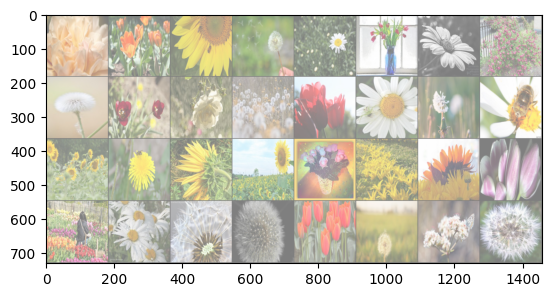

GroundTruth:  roses tulips sunflowers dandelion daisy tulips daisy roses dandelion tulips roses dandelion tulips daisy dandelion daisy sunflowers dandelion sunflowers sunflowers roses tulips sunflowers tulips tulips daisy dandelion dandelion tulips dandelion dandelion dandelion


In [179]:
dataiter = iter(val_loader)
images, labels = next(dataiter)

# print images
imshow(torchvision.utils.make_grid(images))
print('GroundTruth: ', ' '.join(f'{classes[labels[j]]:5s}' for j in range(32)))

In [180]:
PATH = './flowers_net.pth'
torch.save(net.state_dict(), PATH)

In [181]:
net = Net()
net.load_state_dict(torch.load(PATH, weights_only=True))

<All keys matched successfully>

In [182]:
outputs = net(images)

In [183]:
_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join(f'{classes[predicted[j]]:5s}' for j in range(32)))

Predicted:  dandelion tulips dandelion daisy daisy tulips daisy roses dandelion tulips dandelion dandelion tulips daisy daisy sunflowers sunflowers dandelion dandelion dandelion dandelion dandelion sunflowers roses tulips daisy dandelion dandelion roses tulips daisy dandelion


In [184]:
correct = 0
total = 0
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in val_loader:
        images, labels = data
        # calculate outputs by running images through the network
        outputs = net(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the 10000 test images: {100 * correct // total} %')

Accuracy of the network on the 10000 test images: 58 %


In [185]:
from sklearn.metrics import (
    roc_curve, auc,
    precision_recall_curve, f1_score
)
# Evaluate the model using PyTorch
net.to(device)
net.eval()

y_true = []
y_pred = []

for images, labels in val_loader:
    images = images.to(device)
    outputs = net(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')

Macro F1 Score: 0.5762166245424126



10 epochs : (3min)
    Precision: 0.6205357142857143
    Recall: 0.9586206896551724
    F1 Score: 0.7533875338753387
    Macro F1 Score: 0.3904868199912113
30 epochs : (9min)
    Precision: 0.7942857142857143
    Recall: 0.8176470588235294
    F1 Score: 0.8057971014492753
50 epochs : (14 min)
    Precision: 0.8435374149659864
    Recall: 0.8157894736842105
    F1 Score: 0.8294314381270903
    Macro F1 Score: 0.5371161078515057
60 epochs: (18min)
    Macro F1 Score: 0.5762166245424126

    

In [285]:
image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df

,image_path,label
0,tf_flowers_images/roses/1353.jpg,roses
1,tf_flowers_images/roses/1347.jpg,roses
2,tf_flowers_images/roses/2869.jpg,roses
3,tf_flowers_images/roses/162.jpg,roses
4,tf_flowers_images/roses/2470.jpg,roses
...,...,...
3665,tf_flowers_images/tulips/3549.jpg,tulips
3666,tf_flowers_images/tulips/1438.jpg,tulips
3667,tf_flowers_images/tulips/0.jpg,tulips
3668,tf_flowers_images/tulips/2131.jpg,tulips


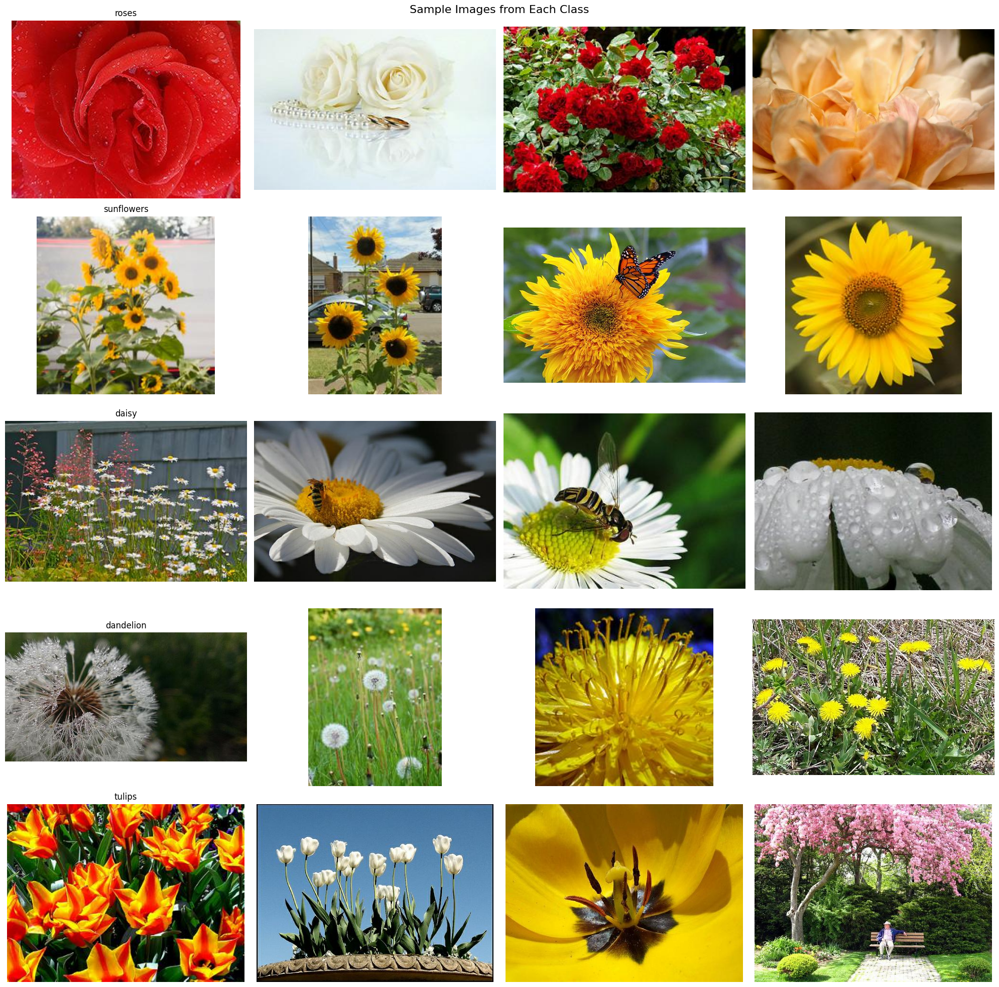

In [286]:

# Get unique classes
classes = df['label'].unique()

# Number of images to display per class
n_images = 4

# Set up the plot
fig, axes = plt.subplots(len(classes), n_images, figsize=(20, 4*len(classes)))
fig.suptitle('Sample Images from Each Class', fontsize=16)

for i, class_name in enumerate(classes):
    # Filter dataframe for current class
    class_df = df[df['label'] == class_name]

    # Randomly sample n_images from this class
    sample_images = class_df['image_path'].sample(n_images).tolist()

    for j, img_path in enumerate(sample_images):
        # Open and display the image
        img = Image.open(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')

        # Set the title for the first image in each row
        if j == 0:
            axes[i, j].set_title(f'{class_name}', fontsize=12)

plt.tight_layout()
plt.show()

In [287]:
test_ratio = 0.20 # 20% of data will go to test

# split the data
train_df, test_df = train_test_split(df, test_size=test_ratio, stratify=df['label'], random_state=42)

print(f"Original dataset shape: {df.shape}")
print(f"Train dataset shape: {train_df.shape}")
print(f"Test dataset shape: {test_df.shape}")


# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

Original dataset shape: (3670, 2)
Train dataset shape: (2936, 2)
Test dataset shape: (734, 2)

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244891
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172343
Name: proportion, dtype: float64

Test:
label
dandelion     0.243869
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.173025
Name: proportion, dtype: float64


In [288]:
IMAGE_SIZE = 124

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

     

In [289]:
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']
label_to_idx = {label: idx for idx, label in enumerate(CLASS_LIST)}


In [290]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label


# create data object
train_data_object = CustomTrainingData(train_df, CLASS_LIST, training_transform)
test_data_object = CustomTrainingData(test_df, CLASS_LIST, test_transform)
     

In [291]:
BATCH_SIZE = 32

# now define dataloader, this will load the images batches from CustomTrainingData object
train_loader = DataLoader(train_data_object, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_data_object, batch_size=BATCH_SIZE, shuffle=True)

In [292]:
class SatelliteImageClassifier(nn.Module):
    def __init__(self, num_classes, input_size=(128, 128), channels=3):
        super(SatelliteImageClassifier, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # Convolutional layers
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        # Batch normalization layers
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(256)

        # Max pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Dropout layer
        self.dropout = nn.Dropout(0.5)

        # Calculate the size of the flattened features
        self._to_linear = None
        self._calculate_to_linear(input_size)

        # Fully connected layers
        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _calculate_to_linear(self, input_size):
        # This function calculates the size of the flattened features
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)

        # Flatten the output for the fully connected layer
        x = x.view(-1, self._to_linear)

        # Fully connected layers with ReLU and dropout
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x
     

In [293]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 100
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

In [294]:
# Initialize the model
model = SatelliteImageClassifier(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [295]:
# Print model summary
print(model)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = model(test_input)
print(f"Output shape: {output.shape}")

SatelliteImageClassifier(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=12544, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5, bias=True)
)
Total number of parameters: 6814981
Output shape: to

In [296]:
# Training loop
for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{EPOCHS}], Loss: {running_loss/len(train_loader):.4f}')

     

Epoch [1/100], Loss: 2.0684
Epoch [2/100], Loss: 1.1442
Epoch [3/100], Loss: 1.0853
Epoch [4/100], Loss: 0.9969
Epoch [5/100], Loss: 0.9422
Epoch [6/100], Loss: 0.9270
Epoch [7/100], Loss: 0.8672
Epoch [8/100], Loss: 0.8452
Epoch [9/100], Loss: 0.8141
Epoch [10/100], Loss: 0.8109
Epoch [11/100], Loss: 0.7520
Epoch [12/100], Loss: 0.6945
Epoch [13/100], Loss: 0.7100
Epoch [14/100], Loss: 0.6357
Epoch [15/100], Loss: 0.6199
Epoch [16/100], Loss: 0.6040
Epoch [17/100], Loss: 0.5765
Epoch [18/100], Loss: 0.5457
Epoch [19/100], Loss: 0.5228
Epoch [20/100], Loss: 0.4993
Epoch [21/100], Loss: 0.4956
Epoch [22/100], Loss: 0.4465
Epoch [23/100], Loss: 0.4135
Epoch [24/100], Loss: 0.4468
Epoch [25/100], Loss: 0.3892
Epoch [26/100], Loss: 0.3832
Epoch [27/100], Loss: 0.3721
Epoch [28/100], Loss: 0.3099
Epoch [29/100], Loss: 0.2876
Epoch [30/100], Loss: 0.2924
Epoch [31/100], Loss: 0.2753
Epoch [32/100], Loss: 0.2474
Epoch [33/100], Loss: 0.2401
Epoch [34/100], Loss: 0.2074
Epoch [35/100], Loss: 0

In [297]:
model.to(device)
model.eval()

y_true = []
y_pred = []

for images, labels in test_loader:
    images = images.to(device)
    outputs = model(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')

Macro F1 Score: 0.7835034778830925


10 epochs : (1min) 
    Macro F1 Score: 0.6342608281458604
50 epochs : (5min)
    Macro F1 Score: 0.7308830796216569
70 epochs : (7min)
    Macro F1 Score: 0.7689266024415194
100 epochs : (10min)
    Macro F1 Score: 0.7835034778830925

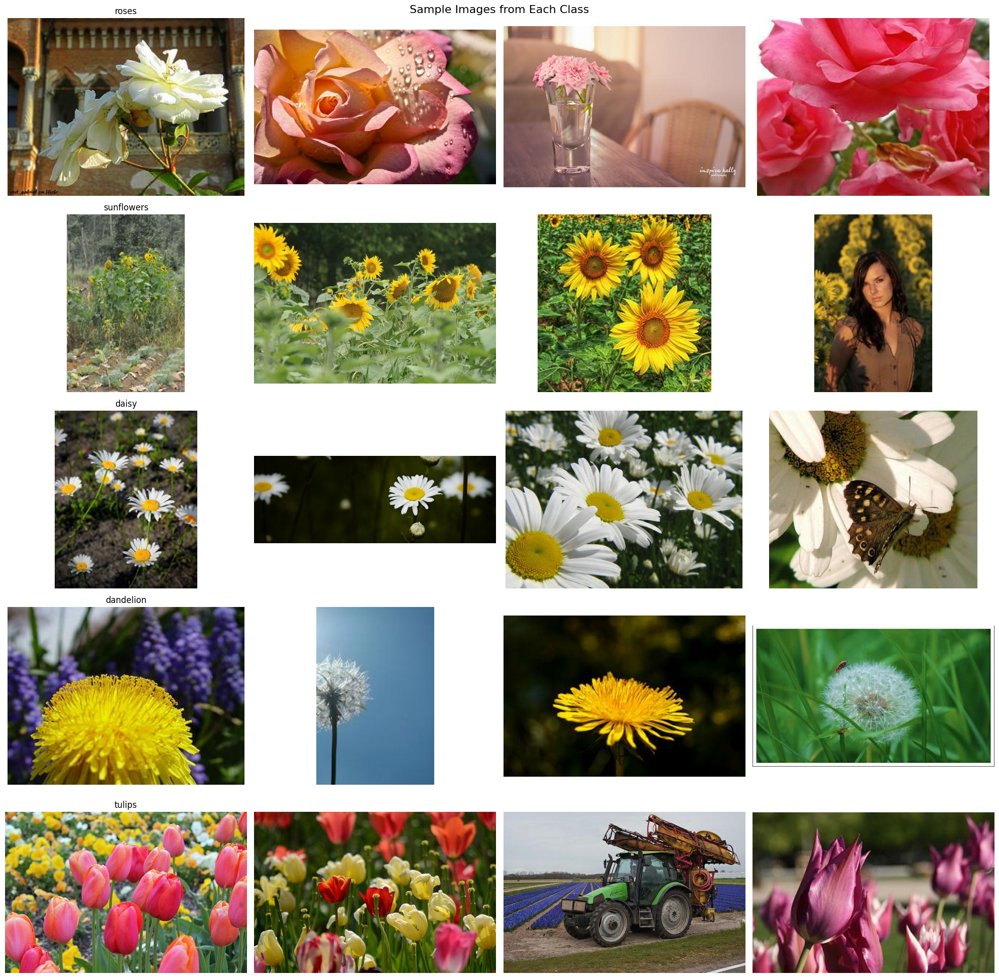

Original dataset shape: (3670, 2)
Train dataset shape: (2936, 2)
Test dataset shape: (734, 2)

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244891
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172343
Name: proportion, dtype: float64

Test:
label
dandelion     0.243869
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.173025
Name: proportion, dtype: float64


In [327]:
# from torchvision import ptransforms

image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df


# Get unique classes
classes = df['label'].unique()

# Number of images to display per class
n_images = 4

# Set up the plot
fig, axes = plt.subplots(len(classes), n_images, figsize=(20, 4*len(classes)))
fig.suptitle('Sample Images from Each Class', fontsize=16)

for i, class_name in enumerate(classes):
    # Filter dataframe for current class
    class_df = df[df['label'] == class_name]

    # Randomly sample n_images from this class
    sample_images = class_df['image_path'].sample(n_images).tolist()

    for j, img_path in enumerate(sample_images):
        # Open and display the image
        img = Image.open(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')

        # Set the title for the first image in each row
        if j == 0:
            axes[i, j].set_title(f'{class_name}', fontsize=12)

plt.tight_layout()
plt.show()

# %%
test_ratio = 0.20 # 20% of data will go to test

# split the data
train_df, test_df = train_test_split(df, test_size=test_ratio, stratify=df['label'], random_state=42)

print(f"Original dataset shape: {df.shape}")
print(f"Train dataset shape: {train_df.shape}")
print(f"Test dataset shape: {test_df.shape}")


# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

# %%
IMAGE_SIZE = 124

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
TRANSFORMS = transforms.Compose([
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])
     

# %%
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [328]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label


# create data object
train_data_object = CustomTrainingData(train_df, CLASS_LIST, TRANSFORMS)
test_data_object = CustomTrainingData(test_df, CLASS_LIST, TRANSFORMS)
     

# %%
BATCH_SIZE = 32

# now define dataloader, this will load the images batches from CustomTrainingData object
train_loader = DataLoader(train_data_object, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_data_object, batch_size=BATCH_SIZE, shuffle=True)


In [329]:
class SatelliteImageClassifier(nn.Module):
    def __init__(self, num_classes, input_size=(128, 128), channels=3):
        super(SatelliteImageClassifier, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # Convolutional layers
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        # Batch normalization layers
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(256)

        # Max pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Dropout layer
        self.dropout = nn.Dropout(0.5)

        # Calculate the size of the flattened features
        self._to_linear = None
        self._calculate_to_linear(input_size)

        # Fully connected layers
        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _calculate_to_linear(self, input_size):
        # This function calculates the size of the flattened features
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)

        # Flatten the output for the fully connected layer
        x = x.view(-1, self._to_linear)

        # Fully connected layers with ReLU and dropout
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x
     

In [330]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 100
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

# %%
# Initialize the model
model = SatelliteImageClassifier(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# %%
# Print model summary
print(model)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = model(test_input)
print(f"Output shape: {output.shape}")

SatelliteImageClassifier(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=12544, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5, bias=True)
)
Total number of parameters: 6814981
Output shape: to

In [331]:
# Training loop
for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{EPOCHS}], Loss: {running_loss/len(train_loader):.4f}')

Epoch [1/100], Loss: 2.1704
Epoch [2/100], Loss: 1.1423
Epoch [3/100], Loss: 1.0550
Epoch [4/100], Loss: 1.0148
Epoch [5/100], Loss: 0.9765
Epoch [6/100], Loss: 0.9314
Epoch [7/100], Loss: 0.9276
Epoch [8/100], Loss: 0.9055
Epoch [9/100], Loss: 0.8787
Epoch [10/100], Loss: 0.8318
Epoch [11/100], Loss: 0.8313
Epoch [12/100], Loss: 0.8349
Epoch [13/100], Loss: 0.8416
Epoch [14/100], Loss: 0.8112
Epoch [15/100], Loss: 0.7558
Epoch [16/100], Loss: 0.7595
Epoch [17/100], Loss: 0.7227
Epoch [18/100], Loss: 0.7482
Epoch [19/100], Loss: 0.6997
Epoch [20/100], Loss: 0.6935
Epoch [21/100], Loss: 0.6766
Epoch [22/100], Loss: 0.6851
Epoch [23/100], Loss: 0.6615
Epoch [24/100], Loss: 0.6415
Epoch [25/100], Loss: 0.6212
Epoch [26/100], Loss: 0.6174
Epoch [27/100], Loss: 0.6128
Epoch [28/100], Loss: 0.5989
Epoch [29/100], Loss: 0.5697
Epoch [30/100], Loss: 0.5680
Epoch [31/100], Loss: 0.5380
Epoch [32/100], Loss: 0.5291
Epoch [33/100], Loss: 0.5413
Epoch [34/100], Loss: 0.5157
Epoch [35/100], Loss: 0

In [333]:
model.to(device)
model.eval()

y_true = []
y_pred = []

for images, labels in test_loader:
    images = images.to(device)
    outputs = model(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')

Macro F1 Score: 0.8051268069054853


10 epochs : (1min)
    Macro F1 Score: 0.6793004942104667
50 epochs : (5min)
    Macro F1 Score: 0.8016273544098269
100 epochs : (13min)
    Macro F1 Score: 0.8051268069054853

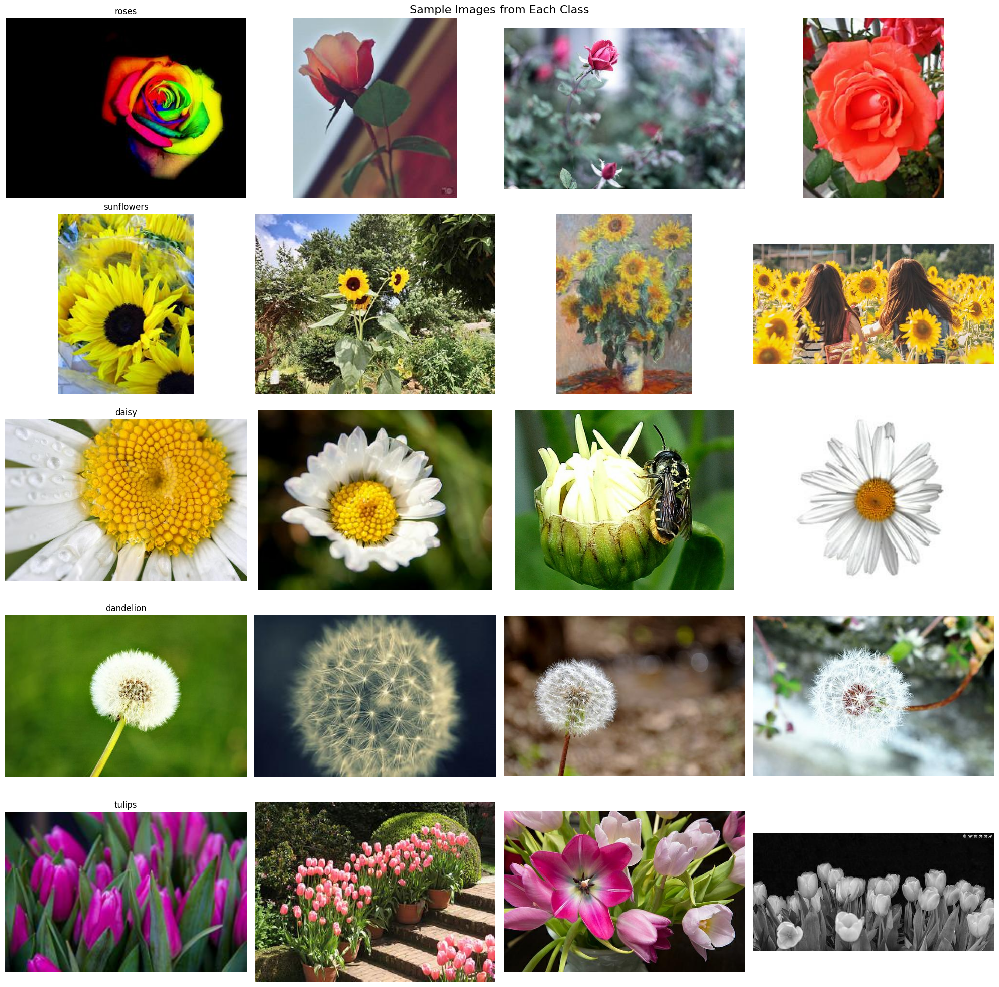

Original dataset shape: (3670, 2)
Train dataset shape: (2936, 2)
Test dataset shape: (734, 2)

Class distribution:
Original:
label
dandelion     0.244687
tulips        0.217711
sunflowers    0.190463
roses         0.174659
daisy         0.172480
Name: proportion, dtype: float64

Train:
label
dandelion     0.244891
tulips        0.217643
sunflowers    0.190395
roses         0.174728
daisy         0.172343
Name: proportion, dtype: float64

Test:
label
dandelion     0.243869
tulips        0.217984
sunflowers    0.190736
roses         0.174387
daisy         0.173025
Name: proportion, dtype: float64


In [335]:
image_path_list = []
label_list = []

for class_cat in os.listdir("tf_flowers_images"):
    if class_cat.startswith("."):   # ignore system files
        continue
    for image_object in os.listdir(f"tf_flowers_images/{class_cat}"):
        if image_object.startswith("."):
            continue
        image_path_list.append(f"tf_flowers_images/{class_cat}/{image_object}")
        label_list.append(class_cat)
df = pd.DataFrame()

df["image_path"] = image_path_list
df["label"] = label_list

df


# Get unique classes
classes = df['label'].unique()

# Number of images to display per class
n_images = 4

# Set up the plot
fig, axes = plt.subplots(len(classes), n_images, figsize=(20, 4*len(classes)))
fig.suptitle('Sample Images from Each Class', fontsize=16)

for i, class_name in enumerate(classes):
    # Filter dataframe for current class
    class_df = df[df['label'] == class_name]

    # Randomly sample n_images from this class
    sample_images = class_df['image_path'].sample(n_images).tolist()

    for j, img_path in enumerate(sample_images):
        # Open and display the image
        img = Image.open(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')

        # Set the title for the first image in each row
        if j == 0:
            axes[i, j].set_title(f'{class_name}', fontsize=12)

plt.tight_layout()
plt.show()

# %%
test_ratio = 0.20 # 20% of data will go to test

# split the data
train_df, test_df = train_test_split(df, test_size=test_ratio, stratify=df['label'], random_state=42)

print(f"Original dataset shape: {df.shape}")
print(f"Train dataset shape: {train_df.shape}")
print(f"Test dataset shape: {test_df.shape}")


# Print class distribution
print("\nClass distribution:")
print("Original:")
print(df['label'].value_counts(normalize=True))
print("\nTrain:")
print(train_df['label'].value_counts(normalize=True))
print("\nTest:")
print(test_df['label'].value_counts(normalize=True))

# %%
IMAGE_SIZE = 124

# this will be used during training, this will hold all the augmentation/transformation configs
training_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# this will be used during testing / infernece, wo don't want any kind of additional transformation applied at the time of running model prediction in test / production inviroment
test_transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                                             transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
TRANSFORMS = transforms.Compose([
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])
     

# %%
# list of classes in your dataset
CLASS_LIST = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [336]:
# Define custom Dataset -> this will help you load images from your csv file
class CustomTrainingData(Dataset):
    def __init__(self, csv_df, class_list, transform=None):
        self.df = csv_df
        self.transform = transform
        self.class_list = class_list

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, index):
        image = Image.open(self.df.iloc[index].image_path).convert('RGB')
        label = self.class_list.index(self.df.iloc[index].label)

        if self.transform:
            image = self.transform(image)

        return image, label


# create data object
train_data_object = CustomTrainingData(train_df, CLASS_LIST, TRANSFORMS)
test_data_object = CustomTrainingData(test_df, CLASS_LIST, TRANSFORMS)
     

# %%
BATCH_SIZE = 32

# now define dataloader, this will load the images batches from CustomTrainingData object
train_loader = DataLoader(train_data_object, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_data_object, batch_size=BATCH_SIZE, shuffle=True)


In [ ]:
class SatelliteImageClassifier(nn.Module):
    def __init__(self, num_classes, input_size=(128, 128), channels=3):
        super(SatelliteImageClassifier, self).__init__()

        self.input_size = input_size
        self.channels = channels

        # Convolutional layers
        self.conv1 = nn.Conv2d(channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        # Batch normalization layers
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(256)

        # Max pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Dropout layer
        self.dropout = nn.Dropout(0.5)

        # Calculate the size of the flattened features
        self._to_linear = None
        self._calculate_to_linear(input_size)

        # Fully connected layers
        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _calculate_to_linear(self, input_size):
        # This function calculates the size of the flattened features
        x = torch.randn(1, self.channels, *input_size)
        self.conv_forward(x)

    def conv_forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0] * x[0].shape[1] * x[0].shape[2]
        return x

    def forward(self, x):
        x = self.conv_forward(x)

        # Flatten the output for the fully connected layer
        x = x.view(-1, self._to_linear)

        # Fully connected layers with ReLU and dropout
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x
     

In [ ]:
# Hyperparameters
BATCH_SIZE = 32
EPOCHS = 10
LEARNING_RATE = 0.001
NUM_CLASSES = len(CLASS_LIST)
INPUT_SIZE = (IMAGE_SIZE, IMAGE_SIZE)
CHANNELS = 3

# %%
# Initialize the model
model = SatelliteImageClassifier(NUM_CLASSES, INPUT_SIZE, CHANNELS).to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# %%
# Print model summary
print(model)

# If you want to see the number of parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

# Test with a random input
test_input = torch.randn(1, CHANNELS, *INPUT_SIZE).to(device)
output = model(test_input)
print(f"Output shape: {output.shape}")

In [ ]:
# Training loop
for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{EPOCHS}], Loss: {running_loss/len(train_loader):.4f}')

In [ ]:
model.to(device)
model.eval()

y_true = []
y_pred = []

for images, labels in test_loader:
    images = images.to(device)
    outputs = model(images)
    _, predicted = torch.max(outputs, 1)
    y_pred.extend(predicted.cpu().numpy())
    y_true.extend(labels.cpu().numpy())

f1 = f1_score(y_true, y_pred, average='macro')

print(f'Macro F1 Score: {f1}')